In [4]:
import librosa
import soundfile as sf
import waveform_analysis
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Audio

In [5]:
signal, sr = sf.read('..\\data\\may-collection-raw\\achterafDbTest.wav')
Audio(data=signal, rate=sr)

2022427

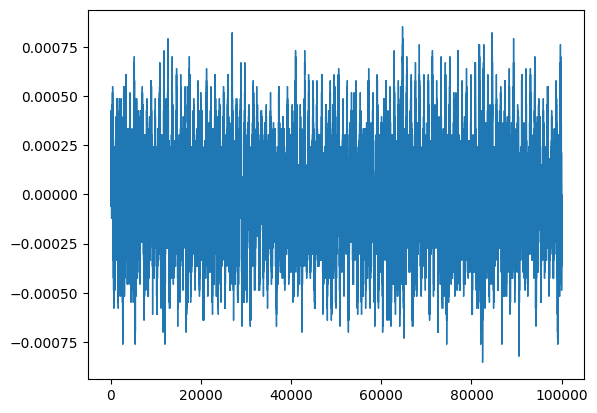

In [41]:
plt.stairs(signal[:100000])
a_weighted_signal = waveform_analysis.A_weight(signal, sr)
len(a_weighted_signal)
# plt.stairs(a_weighted_signal[:100000])


2022427
0
44100
88200
132300
176400
220500
264600
308700
352800
396900
441000
485100
529200
573300
617400
661500
705600
749700
793800
837900
882000
926100
970200
1014300
1058400
1102500
1146600
1190700
1234800
1278900
1323000
1367100
1411200
1455300
1499400
1543500
1587600
1631700
1675800
1719900
1764000
1808100
1852200
1896300
1940400
1984500
[93.9794013186541, 93.97940304794369, 93.97939995185911, 93.97940121106294, 93.97940358447093, 93.97939934196609, 93.97939803016331, 93.97940029170073, 93.97940295069132, 93.97940467141822, 93.97939787152353, 93.97940569229206, 93.97940959058579, 93.9793951142359, 93.97939865662443, 93.97940069594613, 93.97940192356302, 93.97940244705032, 93.97940035387597, 93.97940177095586, 93.97940110128508, 93.97939731016393, 93.97939668551902, 93.97940864442864, 93.97939645511678, 93.97939808165188, 93.97939747780539, 93.97940078453901, 93.97939371479836, 93.97938745766297, 93.97940066304729, 93.97940414874097, 93.97939875839239, 93.97939877290423, 93.979403

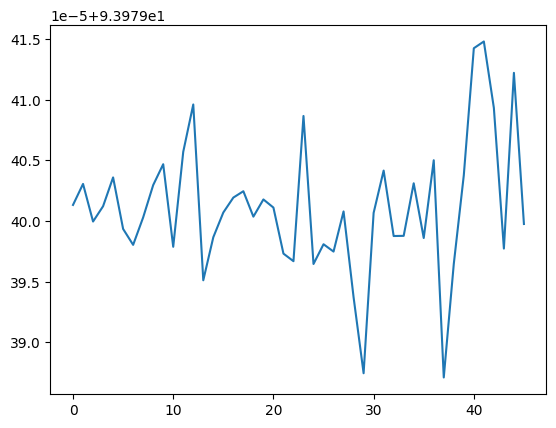

In [43]:
res = []
print(len(a_weighted_signal))
for i in range(0, len(a_weighted_signal), sr):
    print(i)
    res.append(calculate_la_eq(a_weighted_signal[i:i+(sr//33)], sr))
print(res)
plt.plot(res)

A-weighted equivalent continuous sound pressure level (LAeq): 93.98 dB


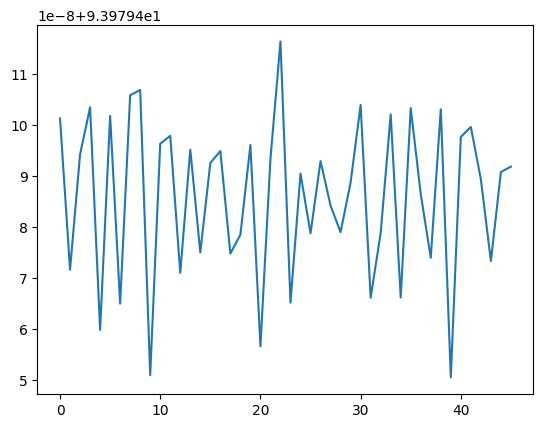

In [33]:
import numpy as np

def apply_a_weighting(signal):
    # Example A-weighting filter coefficients
    a_weighting_coefficients = [1.39742, -0.64892, -2.98709, -1.31319, -0.92189]
    b_weighting_coefficients = [1, -2.09302, 2.88503, -2.91361, 2.31883, -1.20268, 0.20690]
    
    # Apply filter using convolution
    a_weighted_signal = np.convolve(signal, b_weighting_coefficients, mode='same')
    a_weighted_signal /= np.sum(np.abs(a_weighted_signal))  # Normalize
    
    return a_weighted_signal

def calculate_la_eq(dB_values, sampling_rate):
    # Convert dB values to linear scale
    linear_values = 10 ** (np.array(dB_values) / 10)
    
    # # Calculate the squared A-weighted sound pressure levels
    # squared_values = linear_values ** 2
    
    # Duration of measurement period
    duration_seconds = len(linear_values) / sampling_rate
    
    # # Time-weighted integration
    # integrated_value = np.trapz(squared_values, dx=1/sampling_rate)
    
    # Compute RMS value
    # rms_value = np.sqrt(integrated_value / duration_seconds)
    rms_value = np.sqrt(np.mean(linear_values ** 2))
    
    # Reference sound pressure level (20 micro-Pascals)
    p_ref = 20 * 10**-6
    
    # Calculate LAeq in dB
    la_eq = 20 * np.log10(rms_value / p_ref)
    
    return la_eq

# Example dB values (replace with your own)
dB_values = signal  # Example dB values
sampling_rate = 44100  # Example sampling rate in Hz

# Step 1: Apply A-weighting filter
a_weighted_signal = apply_a_weighting(dB_values)

# Step 2: Calculate LAeq
la_eq = calculate_la_eq(a_weighted_signal, sampling_rate)

frame_size = int(1*sr)
s_frame, e_frame = 0, frame_size+1
result = []
while e_frame < len(signal):
    dB_values = signal[s_frame:e_frame]
    a_weighted_signal = apply_a_weighting(dB_values)
    la_eq = calculate_la_eq(a_weighted_signal, sampling_rate)
    result.append(la_eq)
    s_frame, e_frame = e_frame, e_frame+frame_size

dB_values = signal[s_frame:]
a_weighted_signal = apply_a_weighting(dB_values)
la_eq = calculate_la_eq(a_weighted_signal, sampling_rate)
result.append(la_eq)

plt.plot(result)

print("A-weighted equivalent continuous sound pressure level (LAeq): {:.2f} dB".format(la_eq))

In [25]:
a_weighted_signal = waveform_analysis.A_weight(signal, sr)
print(len(signal), len(a_weighted_signal))
a_weighted_signal


# rms_value = np.sqrt(np.mean(np.abs(weighted_signal)**2))
# result = 20 * np.log10(rms_value)

2022427 2022427


array([4.68273595e-05, 1.10180539e-04, 5.93907921e-05, ...,
       1.04858016e-04, 5.90929235e-05, 4.49100918e-05])

In [51]:
# weighted_signal = waveform_analysis.A_weight(signal, sr)
# rms_value = np.sqrt(np.mean(np.abs(weighted_signal)**2))
# result = 20 * np.log10(rms_value)

def signal_to_res(signal_frame, sr):
    weighted_signal = waveform_analysis.A_weight(signal_frame, sr)
    rms_value = np.sqrt(np.mean(np.abs(weighted_signal)**2))
    result = 20 * np.log10(rms_value)
    
    return result

def db_time_array(signal, sr, frame_duration=1, overlap=None):
    """
    args: 
    frame_size: in seconds
    """
    frame_size = int(frame_duration*sr)
    s_frame, e_frame = 0, frame_size+1
    result = []
    while e_frame < len(signal):
        result.append(signal_to_res(signal[s_frame:e_frame], sr))
        s_frame, e_frame = e_frame, e_frame+frame_size
    result.append(signal_to_res(signal[s_frame:], sr))
    return result

db_array = db_time_array(signal, sr, 1)
adj_array = [x + (80-max(db_array)) for x in db_array]



46


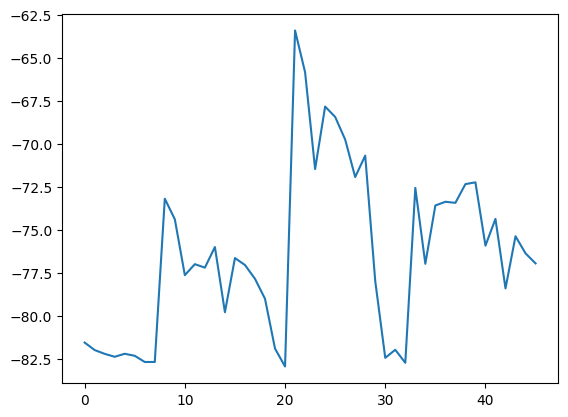

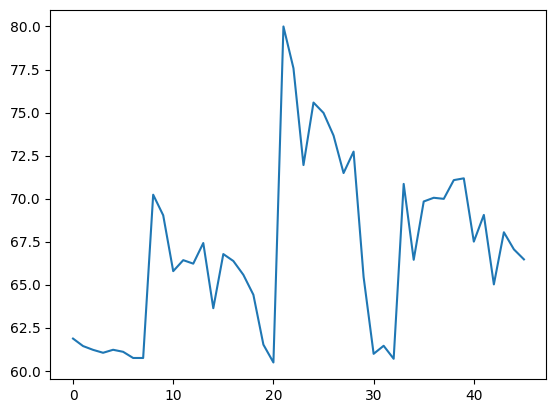

In [52]:
print(len(db_array))
plt.plot(db_array)
plt.show()
plt.plot(adj_array)

In [22]:
Audio(data=signal, rate=sr)

92 [74.62166915135981, 74.65624581997639, 74.69620296559832, 74.67322896472969, 74.71880992490749, 74.69704895367371, 74.71093315142552, 74.74179542933152, 74.68882438183704, 74.72536079605192, 74.72354706627043, 74.7134907099296, 74.74739486195158, 74.76864547270839, 74.74655326787895, 74.76450245953586, 73.5009169741453, 74.01286152618118, 73.99560415574743, 73.7194042218351, 74.24861754557931, 74.17563807783094, 74.27715342936204, 74.03006966460622, 74.27373843280655, 74.07036844045544, 74.13387726172226, 73.9364545538988, 74.25642534773816, 74.76533337619351, 74.27553112290339, 73.96778869596743, 74.02137612958457, 74.30567436787385, 74.3531429166656, 74.1385136138458, 74.48440670186262, 74.265290990022, 74.65329482234272, 74.69866696327668, 74.77668050333834, 74.7935385323006, 72.3, 72.65796685503045, 72.78506534228637, 72.77711550182936, 73.22167455298663, 74.03911796290298, 73.04989054421395, 73.0289085633246, 73.24179550527488, 73.01239024480232, 73.06180048124382, 73.641226624

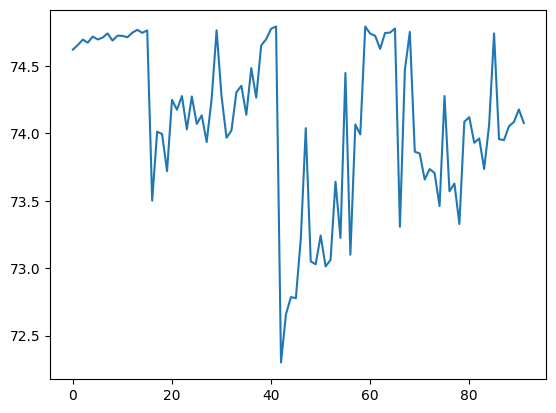

In [23]:
def to_dbSPL(db, max_ref=72.3):
    V_ref = max(db)
    return [(20 * np.log10(V_noise / V_ref) + max_ref) for V_noise in db]

db_spl = to_dbSPL(db_array)
print(len(db_spl), db_spl)
plt.plot(db_spl)


In [70]:
# np.sin(0.5)
# [np.sin(x) for x in range(0,16,1)]
Audio(data=[np.sin(x) for x in np.arange(0,16,0.1)],rate=34)

In [55]:
Audio(data=signal, rate=sr)

In [69]:
[x for x in np.arange(0,16,0.5)]

[0.0,
 0.5,
 1.0,
 1.5,
 2.0,
 2.5,
 3.0,
 3.5,
 4.0,
 4.5,
 5.0,
 5.5,
 6.0,
 6.5,
 7.0,
 7.5,
 8.0,
 8.5,
 9.0,
 9.5,
 10.0,
 10.5,
 11.0,
 11.5,
 12.0,
 12.5,
 13.0,
 13.5,
 14.0,
 14.5,
 15.0,
 15.5]